In [85]:
import pandas as pd
df = pd.read_csv(r'C:\Users\A.R.I\Desktop\Data_Analysis\matchs_grok.csv')

In [58]:
pd.set_option('display.max_columns', None)     
pd.set_option('display.max_colwidth', None)    
df.head()

id                     model_a  \
0  40f981ca-cca6-4e2a-a48c-d10d51884efe        grok-3-preview-02-24   
1  f6991060-79e7-4482-a679-9368e2343056        grok-3-preview-02-24   
2  821f691b-d4a9-4803-a315-a4fa31bc71a2  claude-3-5-sonnet-20241022   
3  f4ede181-263c-4100-84f3-7ac522959508        grok-3-preview-02-24   
4  5f638dad-1dc8-4b72-ac6c-12c2343331ef              gemma-3-27b-it   

                                        model_b    winner  \
0                                       qwq-32b   model_a   
1  gemini-2.5-flash-lite-preview-06-17-thinking       tie   
2                          grok-3-preview-02-24   model_b   
3                gemini-2.5-flash-preview-04-17   model_a   
4                          grok-3-preview-02-24  both_bad   

                  evaluation_session_id  evaluation_order  \
0  578a880d-7c6d-440d-aa5f-19154c5ae3bd                 1   
1  9a764363-dc71-4a0d-915c-80a579631a76                 1   
2  54386bcb-bb67-4644-847f-cd74869dbef4                 1   
3  ebd8c900-f63f-47e4-88c4-af385666a8fc                 1   
4  42ff7f3f-a43e-4450-be97-270bc76b8dfd                 1   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5180 entries, 0 to 5179
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     5180 non-null   object
 1   model_a                5180 non-null   object
 2   model_b                5180 non-null   object
 3   winner                 5180 non-null   object
 4   evaluation_session_id  5180 non-null   object
 5   evaluation_order       5180 non-null   int64 
 6   conversation_a         5180 non-null   object
 7   conversation_b         5180 non-null   object
 8   full_conversation      5180 non-null   object
 9   conv_metadata          5180 non-null   object
 10  category_tag           5180 non-null   object
 11  language               5180 non-null   object
 12  is_code                5180 non-null   bool  
 13  timestamp              5180 non-null   object
 14  turns                  5180 non-null   int64 
 15  response_a           

In [61]:
df_grok = df[(df['grok_in_a']) | (df['grok_in_b'])]

grok_wins_all = (
    (df_grok['winner'].eq('model_a') & df_grok['grok_in_a']).sum()
  + (df_grok['winner'].eq('model_b') & df_grok['grok_in_b']).sum()
)

ties_all = (df_grok['winner'] == 'tie').sum()
total_all = len(df_grok)
losses_all = total_all - grok_wins_all - ties_all

print(f"عملکرد کلی Grok:")
print(f"کل رقابت‌ها: {total_all}")
print(f"بردها: {grok_wins_all}")
print(f"مساوی‌ها: {ties_all}")
print(f"باخت‌ها: {losses_all}")
print(f"درصد برد کلی: {grok_wins_all/total_all*100:.1f}%")

عملکرد کلی Grok:
کل رقابت‌ها: 5180
بردها: 2476
مساوی‌ها: 829
باخت‌ها: 1875
درصد برد کلی: 47.8%


In [62]:
df['winner'].value_counts(dropna=False)

winner
model_b     1963
model_a     1871
tie          829
both_bad     517
Name: count, dtype: int64

In [63]:
df_fa = df[df['language'] == 'fa']

print("تعداد داده‌های فارسی:", len(df_fa))

df_fa = df[df['language'] == 'fa']

pd.set_option('display.max_rows', None)
df_fa

تعداد داده‌های فارسی: 55


id  \
61    e37ae689-b65f-4012-a15e-e6d1ea638c84   
307   b6951a97-0d27-4d14-af98-3186b24b06cd   
392   90ca0a41-8f03-4023-a469-a4abadfaa7c8   
437   975dcd1a-b655-4244-a5da-96ac34697b65   
521   723ecb49-8fc2-450e-a869-b3cef422614c   
612   e029b9b8-f2de-4506-9e06-767ac8fde5f2   
871   5921b978-6933-41ed-b2bd-a34e2b676589   
1244  dd382dcd-f91f-4557-8751-2693c0a1ecb5   
1289  d77fab74-0603-4bba-93fd-ba8184987867   
1373  b335918e-5af1-4d40-83fc-ea991bb77c60   
1448  d2751835-840c-43ca-bec5-c4dcaf02a101   
1581  94bc99f7-27f9-4276-957e-a3214e018606   
1653  e6227782-dd39-4be7-82d2-3291301494e5   
1695  d5678eee-0c6f-489e-a74b-bf28f55cb9ea   
1702  a14d563a-fbb3-4a02-bc93-8e010ddd36c5   
1704  c3af2198-3088-4f97-9721-b173f4f12da9   
1728  ac616266-7a79-4c50-b6d4-808d875ab218   
1779  dcb5da1d-9690-40ba-bb6e-ab662a2691f7   
1902  61578002-edaf-4bc3-809d-bfaf366e7085   
2094  3e22663b-dc8f-4370-a665-a224cb69cba5   
2182  0eb0b2cd-f9bc-469a-8450-e89df57ff797   
2258  f9aa175f-b9e0-4916-9538-55093dd473b6   
2283  fa2a9921-b9ed-4594-9195-81db088fedc0   
2312  824e42cb-5b31-4ca6-9c75-66e3b51bf2c8   
2353  20aec9a3-558b-47fd-9ae3-f97bab7d9124   
2493  e3e17f26-dd77-4058-8ed1-57699e9d71bd   
2611  2266a400-19e2-4446-b80d-5b1363376ff1   
2671  09cd8c2e-2969-4965-9731-244e9cd02ed3   
2851  55162ba8-bbeb-4f70-bf98-9be2c4feae4d   
2854  8e55e6d0-4c40-4433-9639-286a5957f2f9   
2857  1dad81ba-71a3-4690-be6a-9e6a9d20094a   
3098  2217deee-ef70-4112-9fc3-f6057835785e   
3411  6c4fa7c9-ad64-460b-a06e-ce4f12d7175c   
3501  55004388-984a-4064-b7f3-fab64e7ff513   
3577  9399491e-07cc-4182-88a1-da72a02770d7   
3578  8cc3f76c-da93-4583-b488-935ce49b3bae   
3907  5f0d28cb-52ed-4a19-a34a-7d339908abc1   
3934  83a89666-99bb-475d-8107-c6669b5c8d99   
4103  1af66424-542c-40dd-a79f-9e001635ffa5   
4139  e4250fc7-a4c4-4810-b319-cba542b7b6b4   
4156  b63232e8-479f-44d7-aee1-001c1090a701   
4309  88c93829-3a9a-44f8-9285-3295f39720f2   
4348  f3937720-bff6-44b9-8e38-c4ab0376153e   
4397  551e82bc-226f-46c7-843e-6c9c297b7068   
4559  cda9dc1a-a897-4ad4-87d5-bdbdf3740379   
4576  0cce55aa-68ba-4fc1-8116-7d7aaeba3ab8   
4807  7a802678-5cee-48d5-bcb1-d3cb9237bfd8   
4842  feb769f6-9099-45ba-8914-778d57a31803   
4903  ebc7504c-1b40-4f40-a535-f5ea186f978f   
5019  9e9063bb-ce72-4f5b-937c-ada6e463670b   
5031  a82838ce-1aa7-476f-9025-ee4bf3e3311a   
5042  620b41e7-efc5-4b0f-b7e8-48d0d07f1be2   
5065  ea8f2be8-0a3b-4d45-a5b5-2d1e351fc9db   
5129  25244e1a-eb4b-4d6b-b8da-ef7a7b630769   
5169  eb369b47-76aa-4a1d-b2c7-2f4b99f1586c   

                                      model_a  \
61                       grok-3-preview-02-24   
307                claude-3-7-sonnet-20250219   
392                claude-3-7-sonnet-20250219   
437                      grok-3-preview-02-24   
521                               grok-4-0709   
612                          grok-3-mini-high   
871                    llama-3.3-70b-instruct   
1244                     grok-3-preview-02-24   
1289                     grok-3-preview-02-24   
1373                           gemma-3-27b-it   
1448                      mistral-medium-2505   
1581                     grok-3-preview-02-24   
1653                       o4-mini-2025-04-16   
1695                     grok-3-preview-02-24   
1702                       o4-mini-2025-04-16   
1704                     grok-3-preview-02-24   
1728                     grok-3-preview-02-24   
1779               claude-3-5-sonnet-20241022   
1902                claude-3-5-haiku-20241022   
2094                           gemma-3-27b-it   
2182                              grok-4-0709   
2258                     grok-3-preview-02-24   
2283                              grok-4-0709   
2312               claude-3-5-sonnet-20241022   
2353                     grok-3-preview-02-24   
2493                     grok-3-preview-02-24   
2611                    magistral-medium-2506   
2671                          gemma-3n-e4b-it   
2851                              grok-4-0

In [64]:
df_grok_fa = df_fa[(df_fa['grok_in_a']) | (df_fa['grok_in_b'])]

grok_wins = (
    (df_grok_fa['winner'].eq('model_a') & df_grok_fa['grok_in_a']).sum()
  + (df_grok_fa['winner'].eq('model_b') & df_grok_fa['grok_in_b']).sum()
)

total_matches = len(df_grok_fa)

win_rate = grok_wins / total_matches * 100


ties = (df_grok_fa['winner'] == 'tie').sum()
losses = total_matches - grok_wins - ties

print(f" Grok نتایج مدل در داده‌های فارسی:")
print(f"تعداد کل رقابت‌ها: {total_matches}")
print(f" بردها: {grok_wins}")
print(f" مساوی‌ها: {ties}")
print(f" باخت‌ها: {losses}")
print(f" درصد برد: {win_rate:.1f}%")

 Grok نتایج مدل در داده‌های فارسی:
تعداد کل رقابت‌ها: 55
 بردها: 29
 مساوی‌ها: 10
 باخت‌ها: 16
 درصد برد: 52.7%


In [66]:
languages = df['language'].unique()
results = []

for lang in languages:
    subset = df[(df['language'] == lang) & ((df['grok_in_a']) | (df['grok_in_b']))]
    if len(subset) == 0:
        continue
    wins = (
        (subset['winner'].eq('model_a') & subset['grok_in_a']).sum()
      + (subset['winner'].eq('model_b') & subset['grok_in_b']).sum()
    )
    ties = (subset['winner'] == 'tie').sum()
    total = len(subset)
    results.append({
        'language': lang,
        'total': total,
        'wins': wins,
        'ties': ties,
        'losses': total - wins - ties,
        'win_rate(%)': round(wins / total * 100, 1)
    })

import pandas as pd
lang_df = pd.DataFrame(results).sort_values('win_rate(%)', ascending=False)
print(lang_df)

   language  total  wins  ties  losses  win_rate(%)
39    <err>      1     1     0       0        100.0
35       hi      1     1     0       0        100.0
30       ie      1     1     0       0        100.0
26       el      2     2     0       0        100.0
49       bo      1     1     0       0        100.0
42       mk      1     1     0       0        100.0
45      sco      1     1     0       0        100.0
31       ur      4     3     0       1         75.0
37       sr      4     3     0       1         75.0
7        nl      6     4     1       1         66.7
6        id     10     6     0       4         60.0
4        fr     70    42     8      20         60.0
18       uk     12     7     3       2         58.3
10       ja    105    57    14      34         54.3
11       fa     55    29    10      16         52.7
9        pl    447   234    62     151         52.3
14       it     37    19     7      11         51.4
13       pt     64    32    10      22         50.0
32       fi 

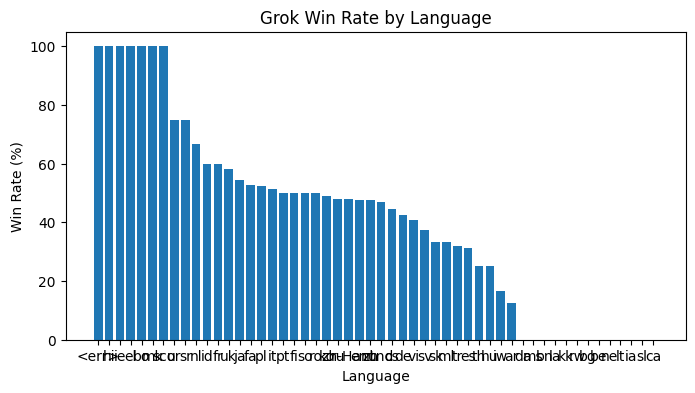

In [27]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.bar(lang_df['language'], lang_df['win_rate(%)'])
plt.title('Grok Win Rate by Language')
plt.xlabel('Language')
plt.ylabel('Win Rate (%)')
plt.show()

In [67]:
filtered = lang_df[lang_df['total'] >= 20]
print(filtered)

   language  total  wins  ties  losses  win_rate(%)
4        fr     70    42     8      20         60.0
10       ja    105    57    14      34         54.3
11       fa     55    29    10      16         52.7
9        pl    447   234    62     151         52.3
14       it     37    19     7      11         51.4
13       pt     64    32    10      22         50.0
12       ko     90    44    12      34         48.9
2        ru    337   162    64     111         48.1
22  zh-Hant     25    12     6       7         48.0
0        en   2806  1336   442    1028         47.6
8        zh    244   116    27     101         47.5
3       und    497   233    84     180         46.9
1        de    158    67    39      52         42.4
19       vi     27    11     5      11         40.7
29       tr     28     9     4      15         32.1
5        es     61    19    13      29         31.1


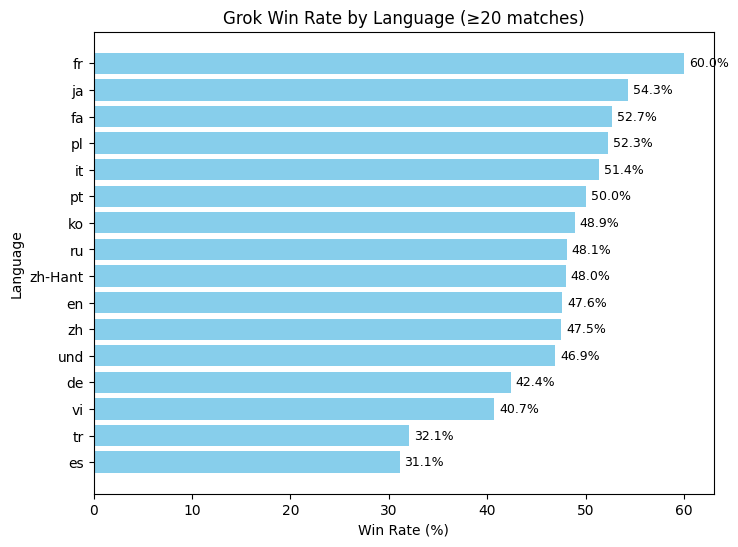

In [68]:
top_langs = filtered.sort_values('win_rate(%)', ascending=True)

plt.figure(figsize=(8,6))
plt.barh(top_langs['language'], top_langs['win_rate(%)'], color='skyblue')
for i, v in enumerate(top_langs['win_rate(%)']):
    plt.text(v + 0.5, i, f"{v:.1f}%", va='center', fontsize=9)
plt.title('Grok Win Rate by Language (≥20 matches)')
plt.xlabel('Win Rate (%)')
plt.ylabel('Language')
plt.show()

In [69]:
def opponent(row):
    if row['grok_in_a']:
        return row['model_b']
    elif row['grok_in_b']:
        return row['model_a']
    else:
        return None

df_grok['opponent'] = df_grok.apply(opponent, axis=1)

rivals = (
    df_grok.groupby('opponent')
    .apply(lambda x: pd.Series({
        'matches': len(x),
        'wins': ((x['winner'].eq('model_a') & x['grok_in_a']) | (x['winner'].eq('model_b') & x['grok_in_b'])).sum(),
        'ties': (x['winner'] == 'tie').sum()
    }))
    .reset_index()
)
rivals['losses'] = rivals['matches'] - rivals['wins'] - rivals['ties']
rivals['win_rate(%)'] = (rivals['wins'] / rivals['matches'] * 100).round(1)
rivals.sort_values('win_rate(%)', ascending=False)

C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\803205839.py:13: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: pd.Series({


,opponent,matches,wins,ties,losses,win_rate(%)
27,gpt-4o-mini-2024-07-18,22,16,2,4,72.7
36,magistral-medium-2506,31,21,2,8,67.7
34,llama-4-maverick-17b-128e-instruct,121,76,13,32,62.8
1,amazon.nova-pro-v1:0,109,67,19,23,61.5
15,gemini-2.0-flash-thinking-exp-01-21,13,8,3,2,61.5
6,claude-3-7-sonnet-20250219-thinking-32k,121,74,18,29,61.2
5,claude-3-7-sonnet-20250219,144,88,13,43,61.1
3,claude-3-5-haiku-20241022,138,83,15,40,60.1
32,llama-3.3-70b-instruct,106,63,13,30,59.4
4,claude-3-5-sonnet-20241022,151,88,18,45,58.3


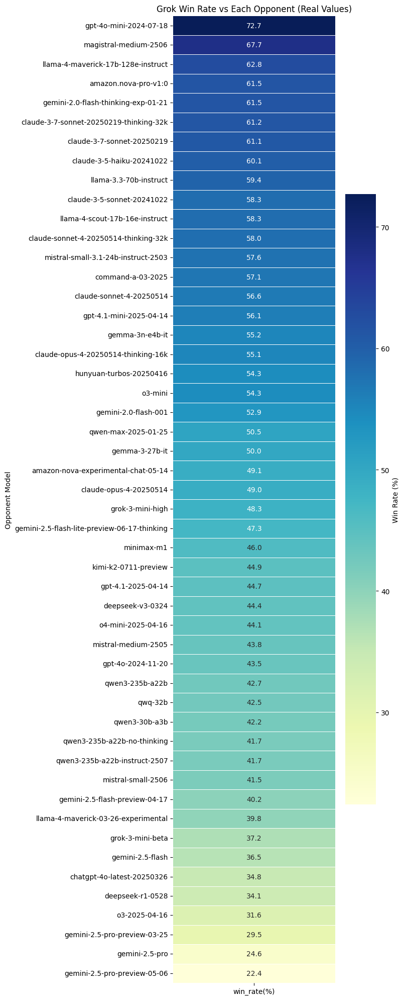

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

rivals_sorted = rivals.sort_values('win_rate(%)', ascending=False)

plt.figure(figsize=(8, len(rivals_sorted) * 0.4))
sns.heatmap(
    rivals_sorted[['win_rate(%)']].set_index(rivals_sorted['opponent']),
    annot=True,
    fmt=".1f",
    cmap='YlGnBu',        
    linewidths=.5,
    cbar_kws={'label': 'Win Rate (%)'}
)
plt.title("Grok Win Rate vs Each Opponent (Real Values)")
plt.xlabel('')
plt.ylabel('Opponent Model')
plt.tight_layout()
plt.show()

C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\3333789476.py:6: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: ((x['winner'].eq('model_a') & x['grok_in_a']) | (x['winner'].eq('model_b') & x['grok_in_b'])).mean() * 100)


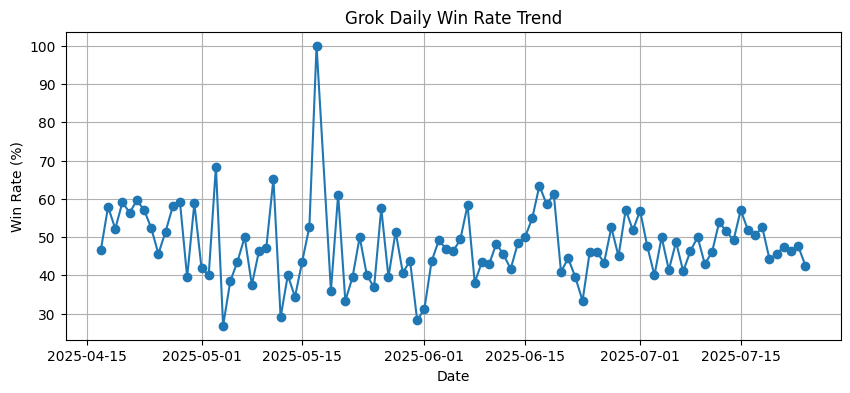

In [20]:
df_grok['timestamp'] = pd.to_datetime(df_grok['timestamp'])
df_grok['date'] = df_grok['timestamp'].dt.date

daily = (
    df_grok.groupby('date')
    .apply(lambda x: ((x['winner'].eq('model_a') & x['grok_in_a']) | (x['winner'].eq('model_b') & x['grok_in_b'])).mean() * 100)
    .reset_index(name='win_rate(%)')
)

plt.figure(figsize=(10,4))
plt.plot(daily['date'], daily['win_rate(%)'], marker='o')
plt.title('Grok Daily Win Rate Trend')
plt.xlabel('Date')
plt.ylabel('Win Rate (%)')
plt.grid(True)
plt.show()

In [72]:
rivals = (
    df_grok.groupby('opponent')
    .apply(lambda x: pd.Series({
        'matches': len(x),
        'wins': ((x['winner'].eq('model_a') & x['grok_in_a']) | 
                 (x['winner'].eq('model_b') & x['grok_in_b'])).sum(),
        'ties': (x['winner'] == 'tie').sum(),
        'losses': ((x['winner'].eq('model_a') & x['grok_in_b']) |
                   (x['winner'].eq('model_b') & x['grok_in_a'])).sum()
    }))
    .reset_index()
)
rivals['win_rate(%)'] = (rivals['wins'] / rivals['matches'] * 100).round(1)

weak_opponents = rivals[rivals['win_rate(%)'] < 35]
weak_opponents

C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\2877889211.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: pd.Series({


,opponent,matches,wins,ties,losses,win_rate(%)
2,chatgpt-4o-latest-20250326,155,54,30,54,34.8
12,deepseek-r1-0528,123,42,17,50,34.1
19,gemini-2.5-pro,171,42,34,75,24.6
20,gemini-2.5-pro-preview-03-25,44,13,10,17,29.5
21,gemini-2.5-pro-preview-05-06,49,11,8,25,22.4
41,o3-2025-04-16,158,50,31,54,31.6


In [73]:
df_grok_weak = df_grok[df_grok['opponent'].isin(weak_opponents['opponent'])]

df_grok_losses = df_grok_weak[
    ((df_grok_weak['winner'].eq('model_a') & df_grok_weak['grok_in_b'])) |
    ((df_grok_weak['winner'].eq('model_b') & df_grok_weak['grok_in_a']))
]

print(f"تعداد باخت‌ها در مقابل مدل‌های ضعیف‌تر: {len(df_grok_losses)}")
df_grok_losses[['opponent','language','user_prompt','response_a','response_b']].head(5)

تعداد باخت‌ها در مقابل مدل‌های ضعیف‌تر: 275


opponent language  \
42                 o3-2025-04-16       en   
46  gemini-2.5-pro-preview-05-06       en   
49  gemini-2.5-pro-preview-05-06       en   
52  gemini-2.5-pro-preview-03-25       en   
54  gemini-2.5-pro-preview-05-06       en   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    user_prompt  \
42                                                                                                                                                                                                                                                                                                                                                                                  one line console command code for a windows 11 system used through ssh that does nvidia-smi every 5 seconds   
46  On a Linux system (Fedora/Red Hat/Rocky based distribution) prepare a customized rsyslog configuration for a PostgreSQL database. That custom configuration must be optimized for a very high number of database logging records per seconds. Also it should completely skip (bypass) any imjournal or rsyslog processing of the records. Because PostgreSQL is set to do a full SQL statement logging which may contain some special characters breaking the imjournal/rsyslog processing.   
49                                                                                                                                                                                                                                                                                                                                             Which routes are typically used by smaller aircraft crossing the Atlantic Ocean, assuming that they can't make the whole trip without refueling.   
52                                                                                                                                                                                                                                                                                                                                                                                                                            Create a Pasta maker game for mobile give me all single html code   
54                                                                                                                                                                                                                                                                                                                                                                                                                                                          How to reduce cost of AWS Textract?   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [51]:
df_grok_losses['len_a'] = df_grok_losses['response_a'].astype(str).apply(len)
df_grok_losses['len_b'] = df_grok_losses['response_b'].astype(str).apply(len)


df_grok_losses['grok_len'] = df_grok_losses.apply(
    lambda x: x['len_a'] if x['grok_in_a'] else x['len_b'], axis=1
)
df_grok_losses['opp_len'] = df_grok_losses.apply(
    lambda x: x['len_b'] if x['grok_in_a'] else x['len_a'], axis=1
)


length_compare = (
    df_grok_losses.groupby('opponent')[['grok_len', 'opp_len']]
    .mean()
    .round(1)
    .sort_values('grok_len', ascending=False)
)

length_compare

C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\1014553007.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_grok_losses['len_a'] = df_grok_losses['response_a'].astype(str).apply(len)
C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\1014553007.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_grok_losses['len_b'] = df_grok_losses['response_b'].astype(str).apply(len)
C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\1014553007.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy 

,grok_len,opp_len
opponent,,
gemini-2.5-pro,4240.4,4364.2
gemini-2.5-pro-preview-05-06,4189.7,4892.6
o3-2025-04-16,4163.5,2938.4
chatgpt-4o-latest-20250326,4129.5,2389.0
gemini-2.5-pro-preview-03-25,4067.6,3916.1
deepseek-r1-0528,3919.4,3001.7


In [74]:
df_grok_losses['grok_in_a'] = df_grok_losses['model_a'].str.contains('grok', case=False, na=False)
df_grok_losses['grok_in_b'] = df_grok_losses['model_b'].str.contains('grok', case=False, na=False)

C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\1181442998.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_grok_losses['grok_in_a'] = df_grok_losses['model_a'].str.contains('grok', case=False, na=False)
C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\1181442998.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_grok_losses['grok_in_b'] = df_grok_losses['model_b'].str.contains('grok', case=False, na=False)


In [75]:
cols_needed = ['model_a','model_b','grok_in_a','grok_in_b','opponent','language','user_prompt','response_a','response_b','winner']
df_grok_losses = df_grok[df_grok['winner'].isin(['model_a','model_b'])].copy()

df_grok_losses = df_grok_losses[
    ((df_grok_losses['winner'].eq('model_a') & df_grok_losses['grok_in_b'])) |
    ((df_grok_losses['winner'].eq('model_b') & df_grok_losses['grok_in_a']))
]

sample_cases = df_grok_losses.sample(3)[['opponent','language','user_prompt','response_a','response_b','grok_in_a']]
for i, row in sample_cases.iterrows():
    print("="*80)
    print(f"Opponent: {row['opponent']} | Language: {row['language']}")
    print(f"Prompt:\n{row['user_prompt']}\n")
    print(f"Grok Response:\n{row['response_a'] if row['grok_in_a'] else row['response_b']}\n")
    print(f"Opponent Response:\n{row['response_b'] if row['grok_in_a'] else row['response_a']}\n")

📌 Opponent: qwen3-235b-a22b-no-thinking | Language: it
🧩 Prompt:
buongiorno.Puoi produrmi un file pdf, un disegno meccanico, traducendo da un file pdf che ti posso dare, le scritte dal cinese all'inglese?

🤖 Grok Response:
Buongiorno! Sì, certo, posso aiutarti a tradurre le scritte da un disegno meccanico in formato PDF dal cinese all'inglese, ma ho bisogno del tuo supporto per alcune fasi del processo, dato che non posso direttamente caricare o scaricare file come un'applicazione tradizionale. Ecco come possiamo procedere:

### Passaggi per ottenere il risultato desiderato:

1. **Forniscimi il testo da tradurre**:
   - Apri il file PDF del disegno meccanico e copia il testo in cinese che desideri tradurre. Puoi incollarlo direttamente qui nella chat.
   - Se il testo è incorporato come immagine nel PDF (non selezionabile), potresti dover utilizzare un software OCR (come Adobe Acrobat, Google Lens o altri strumenti gratuiti online) per estrarre il testo in cinese e poi inviarlo a me.



In [79]:
df_grok_losses_fa = df_grok_losses[df_grok_losses['language'] == 'fa']

n = min(20, len(df_grok_losses_fa)) 
sample_fa = df_grok_losses_fa.sample(n, random_state=42)[
    ['opponent','language','user_prompt','response_a','response_b','grok_in_a']
]

print(f"=====شکست‌های Grok در رقابت‌های فارسی (تعداد: {n}) =====")
for i, row in sample_fa.iterrows():
    print("="*100)
    print(f"Opponent: {row['opponent']} | Language: {row['language']}")
    print(f"Prompt:\n{row['user_prompt']}\n")
    print(f"Grok Response:\n{row['response_a'] if row['grok_in_a'] else row['response_b']}\n")
    print(f"Opponent Response:\n{row['response_b'] if row['grok_in_a'] else row['response_a']}\n")

===== 🟣 شکست‌های Grok در رقابت‌های فارسی (تعداد: 11) =====
📌 Opponent: qwen3-235b-a22b | Language: fa
🧩 Prompt:
میخوام برام پایان نامه بنویسی

🤖 Grok Response:
با عرض سلام! ممنون که با من تماس گرفتی. درخواستت رو برای نوشتن پایان‌نامه دیدم، اما متأسفانه نمی‌تونم یک پایان‌نامه کامل برات بنویسم. اجازه بده توضیح بدم چرا، و بعدش پیشنهادهایی بدم که چطور می‌تونم کمک کنم.

### چرا نمی‌تونم پایان‌نامه کامل بنویسم؟
- **مسائل اخلاقی و قانونی**: نوشتن پایان‌نامه برای کسی دیگه می‌تونه به عنوان تقلب تحصیلی محسوب بشه و با قوانین دانشگاه‌ها و اصول اخلاقی مخالف باشه. پایان‌نامه باید کار شخصی خودت باشه تا ارزش واقعی داشته باشه و مهارت‌هات رو نشون بده.
- **محدودیت‌های من**: من یک مدل زبانی هوش مصنوعی هستم (مثل ChatGPT) و نمی‌تونم تحقیقات اصلی انجام بدم، منابع جدید جمع‌آوری کنم یا محتوای منحصربه‌فرد و سفارشی بر اساس داده‌های واقعی بسازم. علاوه بر این، پایان‌نامه‌ها معمولاً نیاز به دانش تخصصی، داده‌های تجربی و نظارت استاد دارن که من نمی‌تونم فراهم کنم.
- **زمان و حجم**: یک پایان‌نامه کامل (مثلاً ۵۰-۱۰۰ صفح

In [81]:
df_grok_losses_en = df_grok_losses[df_grok_losses['language'] == 'en']

sample_en = df_grok_losses_en.sample(20, random_state=24)[
    ['opponent','language','user_prompt','response_a','response_b','grok_in_a']
]

print("\n===== در رقابت انگلیسی grok شکست های =====")
for i, row in sample_en.iterrows():
    print("="*100)
    print(f" Opponent: {row['opponent']} | Language: {row['language']}")
    print(f" Prompt:\n{row['user_prompt']}\n")
    print(f" Grok Response:\n{row['response_a'] if row['grok_in_a'] else row['response_b']}\n")
    print(f" Opponent Response:\n{row['response_b'] if row['grok_in_a'] else row['response_a']}\n")


===== در رقابت انگلیسی grok شکست های =====
 Opponent: o4-mini-2025-04-16 | Language: en
 Prompt:
Write a python pygame prototype game. Create an isometric grid that will be the map for player and monster to move on. Allow to move the player with arrow keys and attack with spacebar. Create a couple of monsters on the map. When player is moving or attacking make the time flow normally but when player is not giving any input make time slow down 10x

 Grok Response:
Here's a Python Pygame prototype for an isometric grid-based game with the features you requested. This code creates a basic game with player movement, attacks, monsters, and time manipulation:

```python
import pygame
import math
import random
import time

# Initialize Pygame
pygame.init()

# Constants
SCREEN_WIDTH = 800
SCREEN_HEIGHT = 600
TILE_SIZE = 32
GRID_WIDTH = 10
GRID_HEIGHT = 10
FPS = 60

# Colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)
RED = (255, 0, 0)
GREEN = (0, 255, 0)
BLUE = (0, 0, 255)

# Set up the display


In [84]:
import re
import pandas as pd

df_grok_losses_fa['len_grok'] = df_grok_losses_fa.apply(
    lambda x: len(x['response_a']) if x['grok_in_a'] else len(x['response_b']), axis=1)
df_grok_losses_fa['len_opp'] = df_grok_losses_fa.apply(
    lambda x: len(x['response_b']) if x['grok_in_a'] else len(x['response_a']), axis=1)


df_grok_losses_fa['lines_grok'] = df_grok_losses_fa.apply(
    lambda x: x['response_a'].count('\n') if x['grok_in_a'] else x['response_b'].count('\n'), axis=1)
df_grok_losses_fa['lines_opp'] = df_grok_losses_fa.apply(
    lambda x: x['response_b'].count('\n') if x['grok_in_a'] else x['response_a'].count('\n'), axis=1)


df_grok_losses_fa['grok_has_list'] = df_grok_losses_fa.apply(
    lambda x: bool(re.search(r'[\d\-•]\s', x['response_a'] if x['grok_in_a'] else x['response_b'])), axis=1)
df_grok_losses_fa['opp_has_list'] = df_grok_losses_fa.apply(
    lambda x: bool(re.search(r'[\d\-•]\s', x['response_b'] if x['grok_in_a'] else x['response_a'])), axis=1)


df_grok_losses_fa['prompt_len'] = df_grok_losses_fa['user_prompt'].astype(str).apply(len)
df_grok_losses_fa['prompt_words'] = df_grok_losses_fa['user_prompt'].astype(str).apply(lambda t: len(t.split()))


summary_fa = pd.DataFrame({
    'میانگین طول پاسخ Grok': [df_grok_losses_fa['len_grok'].mean()],
    'میانگین طول پاسخ رقیب': [df_grok_losses_fa['len_opp'].mean()],
    'میانگین خطوط پاسخ Grok': [df_grok_losses_fa['lines_grok'].mean()],
    'میانگین خطوط پاسخ رقیب': [df_grok_losses_fa['lines_opp'].mean()],
    'درصد پاسخ‌های لیستی Grok': [df_grok_losses_fa['grok_has_list'].mean() * 100],
    'درصد پاسخ‌های لیستی رقیب': [df_grok_losses_fa['opp_has_list'].mean() * 100],
    'میانگین طول پرامپت (حروف)': [df_grok_losses_fa['prompt_len'].mean()],
    'میانگین تعداد کلمات پرامپت': [df_grok_losses_fa['prompt_words'].mean()]
}).round(1)

summary_fa.T  

C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\3438941320.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_grok_losses_fa['len_grok'] = df_grok_losses_fa.apply(
C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\3438941320.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_grok_losses_fa['len_opp'] = df_grok_losses_fa.apply(
C:\Users\A.R.I\AppData\Local\Temp\ipykernel_12592\3438941320.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

,0
میانگین طول پاسخ Grok,2916.1
میانگین طول پاسخ رقیب,1845.5
میانگین خطوط پاسخ Grok,39.9
میانگین خطوط پاسخ رقیب,33.2
درصد پاسخ‌های لیستی Grok,72.7
درصد پاسخ‌های لیستی رقیب,63.6
میانگین طول پرامپت (حروف),123.3
میانگین تعداد کلمات پرامپت,25.2
